# Railway Track Fault Detection
---
|Subject:|Mathematical Modeling Practice|
|---|---|
|Semester:|Fall 2022|
|Name:|Tamás Demus|
|NEPTUN:|XP4B9D|
---

## Dataset
---
|Name:|Railway Track Fault Detection|
|---|---|
|Link to dataset:|https://www.kaggle.com/datasets/salmaneunus/railway-track-fault-detection|
---

Importing modules

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

import cv2 as cv

import tensorflow as tf

from tqdm import trange, tqdm
import os

2022-12-03 16:45:38.926049: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-03 16:45:39.221574: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/demust/py39/lib/python3.9/site-packages/cv2/../../lib64:
2022-12-03 16:45:39.221652: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-12-03 16:45:40.143608: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror:

Setting up environment

In [2]:
PATH = [
    './data/Train/Non defective/',
    './data/Train/Defective/',
    './data/Validation/Non defective/',
    './data/Validation/Defective/',
    './data/Test/Non defective/',
    './data/Test/Defective/',
]

PATH_tmp = '-/tmp/'

Creating image dataframe

In [3]:
images = pd.DataFrame(columns=[
    'type',
    'defect',
    'defect_str',
    'path',
    'filename',
    'img'
])

for each in PATH:
    p = each.split('/')
    t = p[2].lower()
    if p[3] == 'Defective':
        y = 1
    else:
        y = 0
    for img in os.listdir(each):
        d = {
            'type': t,
            'defect': y,
            'defect_str': p[3],
            'path': each,
            'filename': img,
            'img': os.path.join(each, img)
        }
        df = pd.DataFrame(data=d, index=[1])
        images = pd.concat([images, df])

images.reset_index(inplace=True, drop=True)
images

,type,defect,defect_str,path,filename,img
0,train,0,Non defective,./data/Train/Non defective/,IMG_20201114_103009.jpg,./data/Train/Non defective/IMG_20201114_103009...
1,train,0,Non defective,./data/Train/Non defective/,IMG_20201114_100134.jpg,./data/Train/Non defective/IMG_20201114_100134...
2,train,0,Non defective,./data/Train/Non defective/,IMG_20201114_101046.jpg,./data/Train/Non defective/IMG_20201114_101046...
3,train,0,Non defective,./data/Train/Non defective/,IMG_20201114_102902.jpg,./data/Train/Non defective/IMG_20201114_102902...
4,train,0,Non defective,./data/Train/Non defective/,IMG_20201114_103326.jpg,./data/Train/Non defective/IMG_20201114_103326...
...,...,...,...,...,...,...
379,test,1,Defective,./data/Test/Defective/,IMG_20201114_101200.jpg,./data/Test/Defective/IMG_20201114_101200.jpg
380,test,1,Defective,./data/Test/Defective/,IMG_20201114_101124.jpg,./data/Test/Defective/IMG_20201114_101124.jpg
381,test,1,Defective,./data/Test/Defective/,IMG_20201211_121713.jpg,./data/Test/Defective/IMG_20201211_121713.jpg
382,test,1,Defective,./data/Test/Defective/,IMG_20201114_100159.jpg,./data/Test/Defective/IMG_20201114_100159.jpg


Check the shape of the images

In [4]:
img_shape = []
for each in tqdm(images.img):
    image = cv.imread(each)
    img_shape.append(image.shape)

100%|██████████| 384/384 [01:14<00:00,  5.18it/s]


Minimum  width  :  148  @  177
Maximum  width  :  8000  @  281
Minimum  height  :  156  @  275
Maximum  height  :  8000  @  157
Minimum  components  :  3  @  0
Maximum  components  :  3  @  0
Minimum  size  :  28712  @  177
Maximum  size  :  48000000  @  157


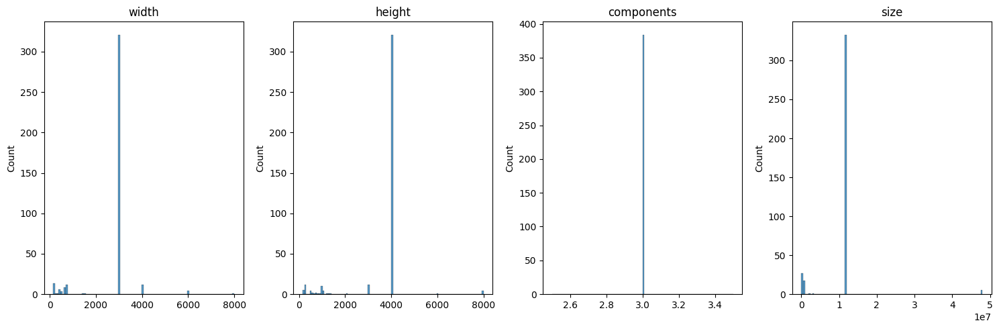

In [5]:
img_shape = np.array(img_shape)

fig, ax = plt.subplots(1, 4, figsize=(15, 5), tight_layout=True)

dims = ['width', 'height', 'components','size']
for i, dim in enumerate(dims):
    if i < 3:
        vector = img_shape[:, i]
    else:
        vector = img_shape[:, 0] * img_shape[:, 1]
    sns.histplot(vector, bins=100, ax=ax[i])
    ax[i].set_title(dim)
    print('Minimum ', dim, ' : ', min(vector), ' @ ', np.argmin(vector))
    print('Maximum ', dim, ' : ', max(vector), ' @ ', np.argmax(vector))



Check if dataset is balanced

In [6]:
images.groupby(['type', 'defect_str']).count()

defect  path  filename  img
type       defect_str                                
test       Defective          11    11        11   11
           Non defective      11    11        11   11
train      Defective         150   150       150  150
           Non defective     150   150       150  150
validation Defective          31    31        31   31
           Non defective      31    31        31   31

Generating random sample from training data

In [7]:
N_samples = 16
random_sample_idx = []
for i in range(N_samples):
    idx = np.random.choice(images[images.type == 'train'].index)
    random_sample_idx.append(idx)
random_sample = images.iloc[random_sample_idx].copy()
random_sample

,type,defect,defect_str,path,filename,img
158,train,1,Defective,./data/Train/Defective/,IMG_20201114_101658.jpg,./data/Train/Defective/IMG_20201114_101658.jpg
243,train,1,Defective,./data/Train/Defective/,131275810_2686956714949012_5021348409242545922...,./data/Train/Defective/131275810_2686956714949...
124,train,0,Non defective,./data/Train/Non defective/,IMG_20201114_100831.jpg,./data/Train/Non defective/IMG_20201114_100831...
63,train,0,Non defective,./data/Train/Non defective/,IMG_20201114_101027.jpg,./data/Train/Non defective/IMG_20201114_101027...
244,train,1,Defective,./data/Train/Defective/,SN_RDH_GTW_BrokenRail_2.jpg.gallery.jpg,./data/Train/Defective/SN_RDH_GTW_BrokenRail_2...
96,train,0,Non defective,./data/Train/Non defective/,IMG_20201114_101651.jpg,./data/Train/Non defective/IMG_20201114_101651...
252,train,1,Defective,./data/Train/Defective/,IMG_20201114_103059.jpg,./data/Train/Defective/IMG_20201114_103059.jpg
185,train,1,Defective,./data/Train/Defective/,IMG_20201211_113506.jpg,./data/Train/Defective/IMG_20201211_113506.jpg
252,train,1,Defective,./data/Train/Defective/,IMG_20201114_103059.jpg,./data/Train/Defective/IMG_20201114_103059.jpg
221,train,1,Defective,./data/Train/Defective/,IMG_20201114_102808.jpg,./data/Train/Defective/IMG_20201114_102808.jpg


Visualizing random sample

100%|██████████| 16/16 [00:04<00:00,  3.72it/s]


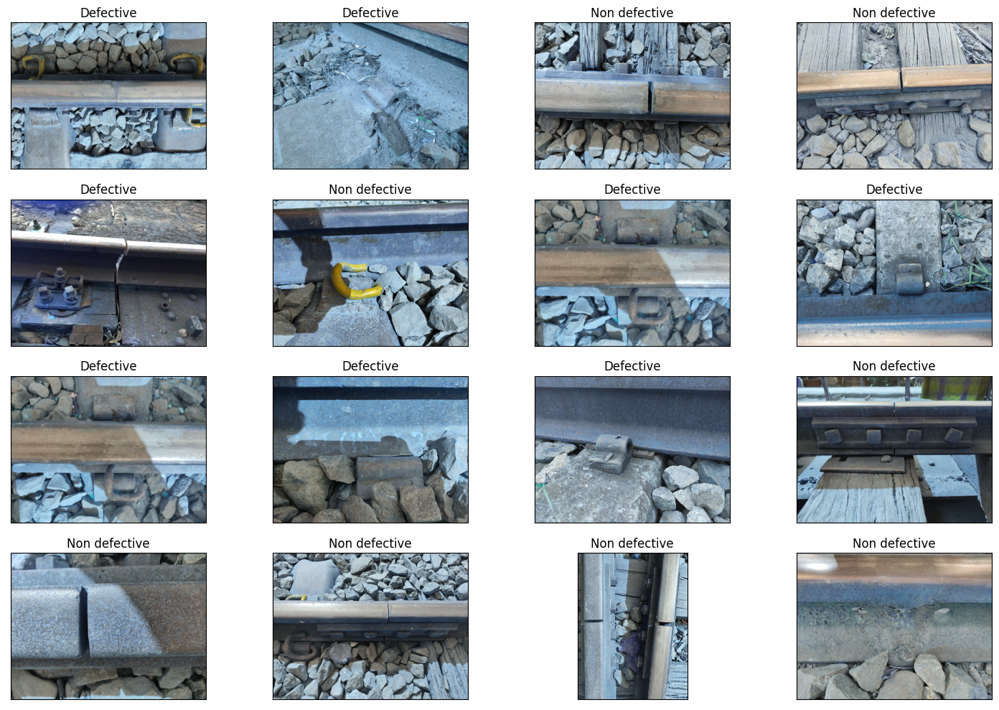

In [8]:
dim = np.ceil(np.sqrt(N_samples)).astype(int)
fig, ax = plt.subplots(dim, dim, figsize=(15, 10), tight_layout=True)
ax = ax.flatten()

for i, idx in enumerate(tqdm(random_sample.index)):
    image = cv.imread(images.img[idx])
    ax[i].imshow(image)
    ax[i].set_xticks(ticks=[])
    ax[i].set_yticks(ticks=[])
    ax[i].set_title(images.defect_str[idx])

plt.show()


Checking basic information on random sample: color components on RGB and HSV

100%|██████████| 16/16 [17:10<00:00, 64.38s/it]


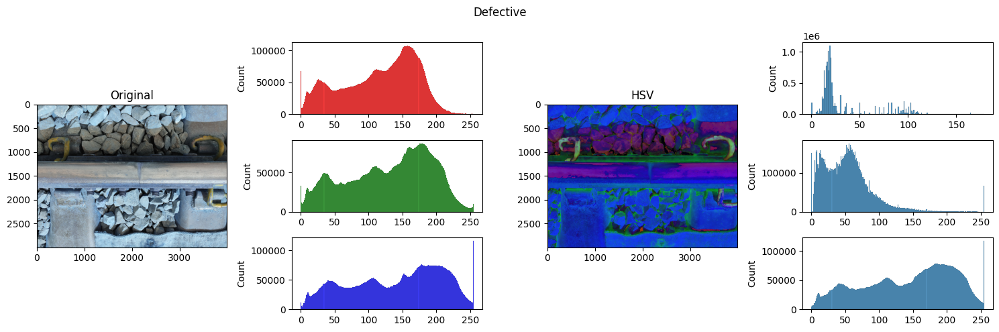

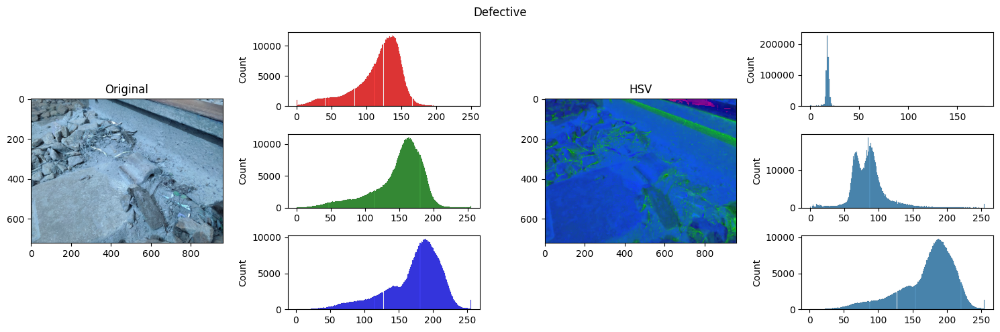

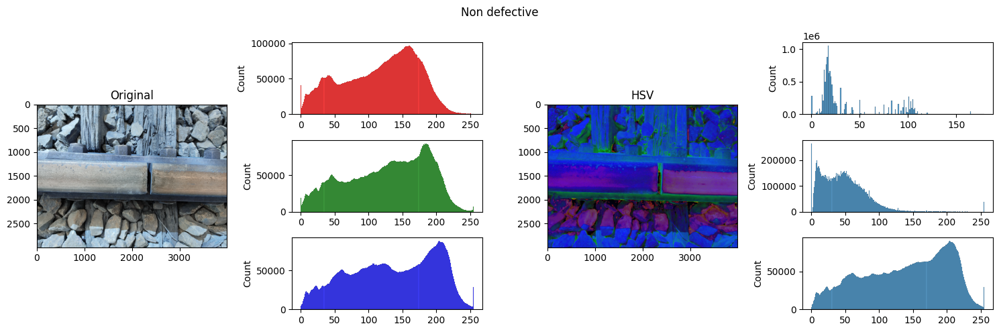

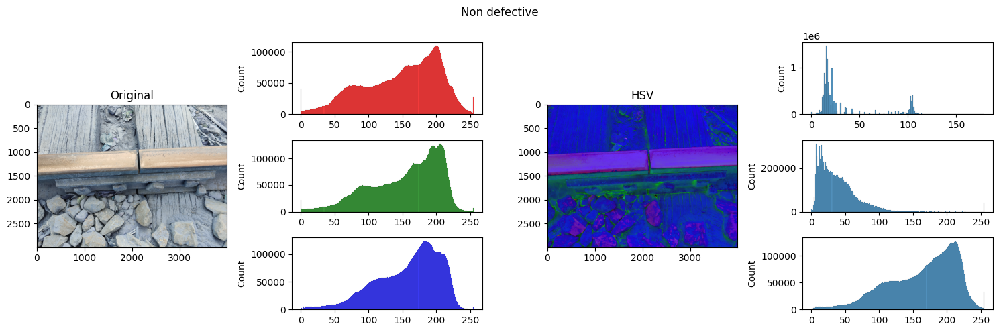

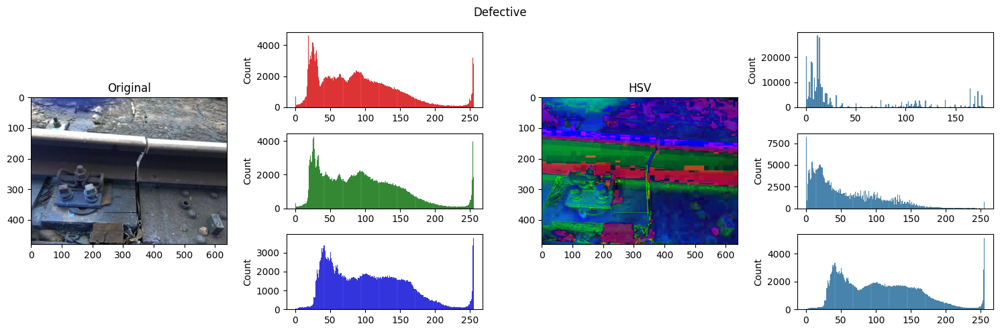

...

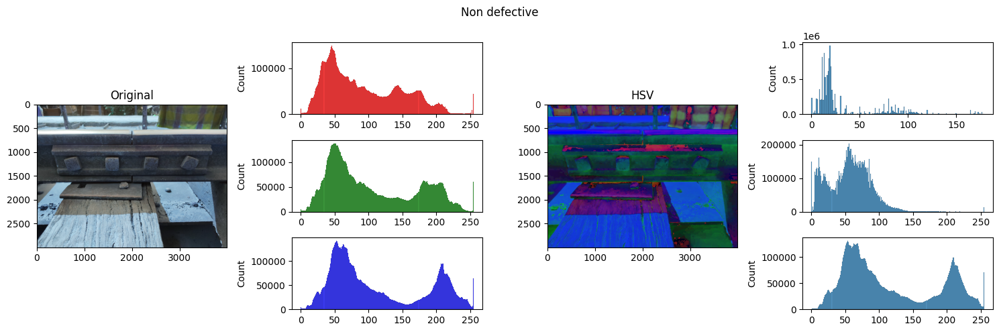

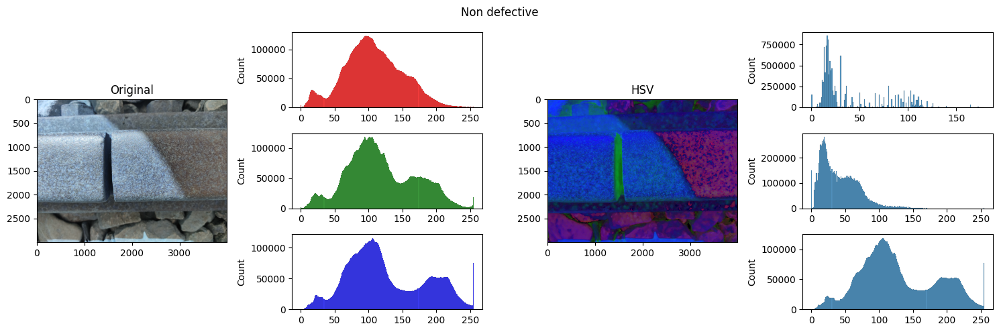

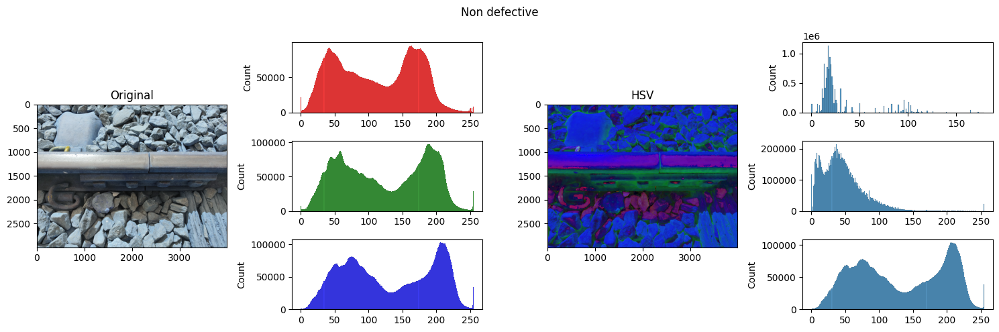

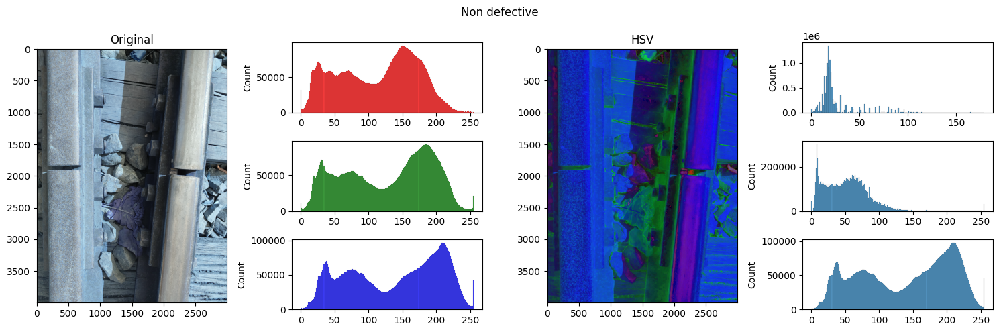

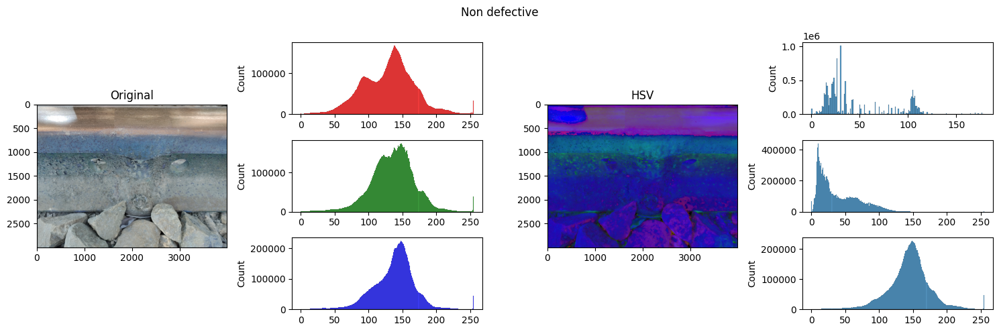

In [9]:
gs = gridspec.GridSpec(3, 4)

for each in tqdm(
    (
        random_sample[['img', 'defect_str']].to_numpy()
    ).tolist()
):
    fig = plt.figure(figsize=(15, 5), tight_layout=True)
    fig.suptitle(each[1])
    ax = [
        fig.add_subplot(gs[:, 0]),
        fig.add_subplot(gs[0, 1]),
        fig.add_subplot(gs[1, 1]),
        fig.add_subplot(gs[2, 1]),
        fig.add_subplot(gs[:, 2]),
        fig.add_subplot(gs[0, 3]),
        fig.add_subplot(gs[1, 3]),
        fig.add_subplot(gs[2, 3]),
    ]
    image = cv.imread(each[0])
    ax[0].imshow(image)
    ax[0].set_title('Original')
    
    for c, component in enumerate(['red', 'green', 'blue']):
        sns.histplot(image[:, :, c].ravel(), bins=256, color=component, ax=ax[c+1])
        ax[c+1].set_ylabel(component)
        ax[c+1].set_yticks([])
        
    hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)
    ax[4].imshow(hsv)
    ax[4].set_title('HSV')
    
    for c, component in enumerate(['hue', 'saturation', 'value']):
        bins = [180, 256, 256]
        sns.histplot(hsv[:, :, c].ravel(), bins=bins[c], ax=ax[c+5])
        ax[c+5].set_ylabel(component)
        ax[c+5].set_yticks([])

We can consider a rail non-defective when it is not broken and there is proper mounting to the sleepers.

Idea: this might be detected via the continuity of the edges: on the top it should be continuous, at the bottom it should be periodically intersected by the mounting elements.

100%|██████████| 16/16 [00:07<00:00,  2.22it/s]


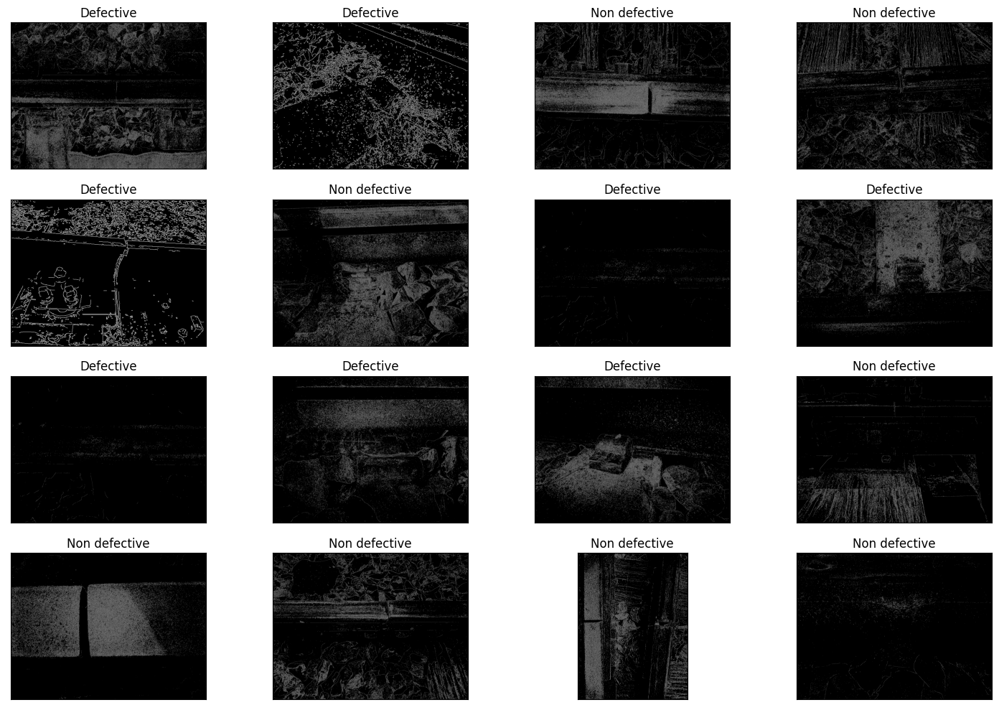

In [10]:
fig, ax = plt.subplots(dim, dim, figsize=(15, 10), tight_layout=True)
ax = ax.flatten()

for i, idx in enumerate(tqdm(random_sample.index)):
    image = cv.imread(images.img[idx])
    edges = cv.Canny(image, 150, 200)
    ax[i].imshow(edges, cmap='gray')
    ax[i].set_xticks(ticks=[])
    ax[i].set_yticks(ticks=[])
    ax[i].set_title(images.defect_str[idx])

plt.show()

Experimenting with image processing pipeline

100%|██████████| 16/16 [00:05<00:00,  2.73it/s]


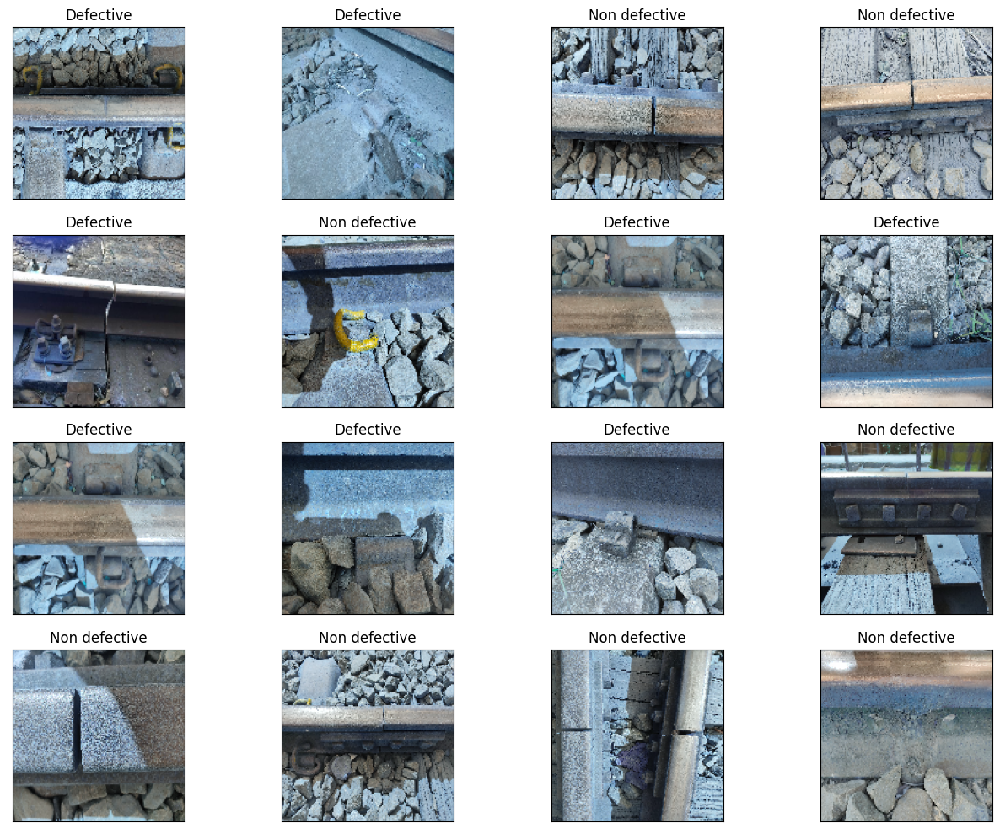

In [11]:
fig, ax = plt.subplots(dim, dim, figsize=(15, 10), tight_layout=True)
ax = ax.flatten()

for i, idx in enumerate(tqdm(random_sample.index)):
    image = cv.imread(images.img[idx])
    resized = cv.resize(image, (150, 150))
    ax[i].imshow(resized)
    ax[i].set_xticks(ticks=[])
    ax[i].set_yticks(ticks=[])
    ax[i].set_title(images.defect_str[idx])

Setting up neural network